In [1]:
import pandas as pd
import numpy as np
import cv2
from matplotlib import pyplot as plt

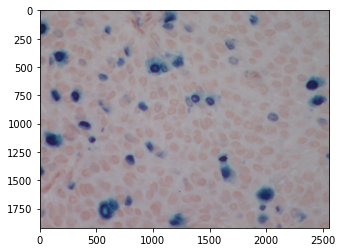

In [462]:
img1=cv2.imread("3053 KI67.jpg")
plt.imshow(img1)

In [463]:
hist_c,bins_c = np.histogram(img1.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c = hist_c.cumsum()
cdf_c_normalized = cdf_c * hist_c.max()/ cdf_c.max()

In [464]:
image_yuv = cv2.cvtColor(img1, cv2.COLOR_BGR2YUV)

# Applying Histogram Equalization on the original imageof the Y channel
image_yuv[:,:,0] = cv2.equalizeHist(image_yuv[:,:,0])

# Convert the YUV image back to RGB format
image_c_equalized = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2BGR)

# Generating the histogram of the equalized image
hist_c_equalized, bins_c_equalized = np.histogram(image_c_equalized.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c_equalized = hist_c_equalized.cumsum()
cdf_c_equalized_normalized = cdf_c_equalized * hist_c_equalized.max()/ cdf_c_equalized.max()

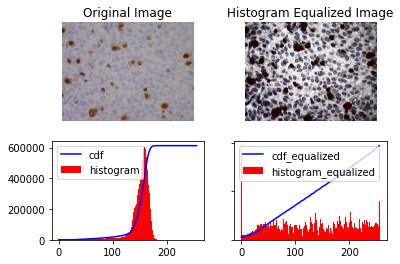

In [465]:
fig, axs = plt.subplots(2, 2)

axs[0, 0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axs[0, 0].axis('off')
axs[0, 0].set_title('Original Image')

axs[0, 1].imshow(cv2.cvtColor(image_c_equalized, cv2.COLOR_BGR2RGB))
axs[0, 1].axis('off')
axs[0, 1].set_title('Histogram Equalized Image')


axs[1, 0].plot(cdf_c_normalized, color = 'b')
axs[1, 0].hist(img1.flatten(),256,[0,256], color = 'r')
axs[1, 0].legend(('cdf','histogram'), loc = 'upper left')



axs[1, 1].plot(cdf_c_equalized_normalized, color = 'b')
axs[1, 1].hist(image_c_equalized.flatten(),256,[0,256], color = 'r')
axs[1, 1].legend(('cdf_equalized','histogram_equalized'), loc = 'upper left')


# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

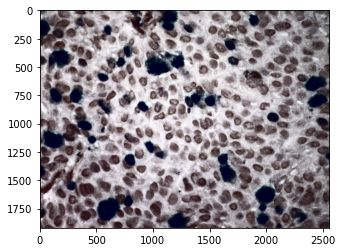

In [466]:
plt.imshow(image_c_equalized)

In [467]:
save_img=cv2.cvtColor(image_c_equalized, cv2.COLOR_BGR2RGB)
cv2.imwrite("3053_contrast.jpg",save_img)

True

In [468]:
blur = cv2.GaussianBlur(image_c_equalized,(13,13),0)

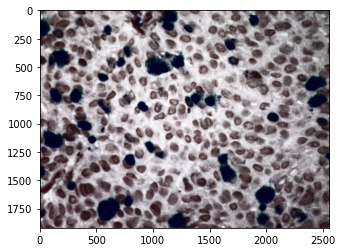

In [469]:
plt.imshow(blur)

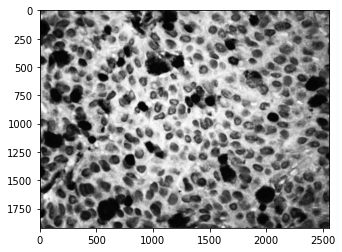

In [470]:
gray1=cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)
plt.imshow(gray1,'gray')

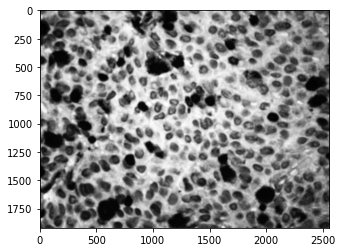

In [471]:
blur = cv2.GaussianBlur(gray1,(21,21),0)
plt.imshow(blur,'gray')

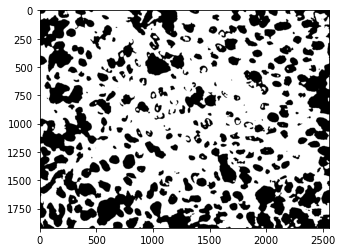

In [472]:
threshold,binary2=cv2.threshold(blur,100,255,cv2.THRESH_BINARY)
plt.imshow(binary2,'gray')

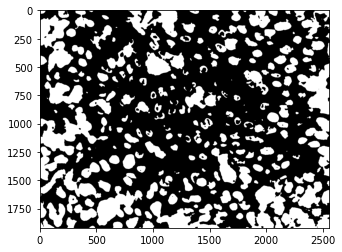

In [473]:
binary=binary2-255
plt.imshow(binary,'gray')

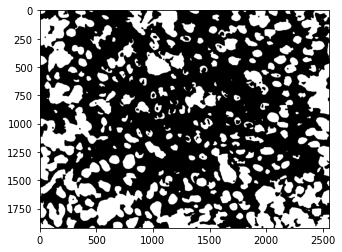

In [474]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=4)
plt.imshow(closed,'gray')

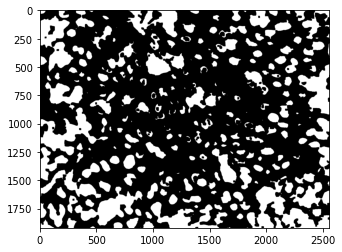

In [475]:
kernel = np.ones((2,2),np.uint8)
erosion = cv2.erode(closed, kernel, iterations=5)
plt.imshow(erosion,'gray')

In [476]:
contour2, hierarchy = cv2.findContours(image=erosion.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

In [477]:
len(contour2)

273

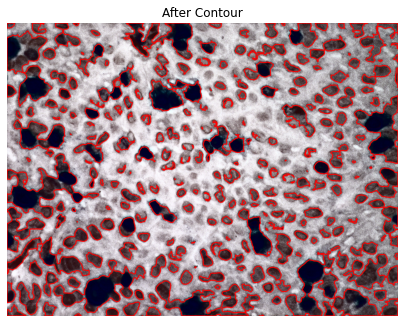

In [478]:
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>0):
        cells=cells+1
    
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [269]:
cells

264

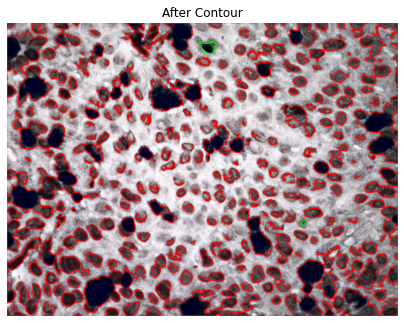

In [479]:
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=70, color=(0,255,0), thickness=5)
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=255, color=(0,255,0), thickness=5)
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [271]:
area=cv2.contourArea(contour2[255])
area

5307.5

In [272]:
area=cv2.contourArea(contour2[70])
area

843.5

In [273]:
cells=0
for i in range(len(contour2)):
    area=cv2.contourArea(contour2[i])
    if(area>600):
        if(area>5500):
            cells=cells+(area//5500)
        else:
            cells=cells+1 

In [274]:
cells

314.0

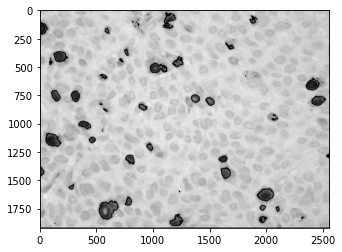

In [795]:
gray_org=cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_org,'gray')

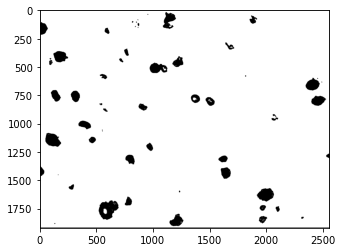

In [796]:
thresh, binary = cv2.threshold(gray_org, thresh=100, maxval=255, type=cv2.THRESH_BINARY)
plt.imshow(binary,'gray')

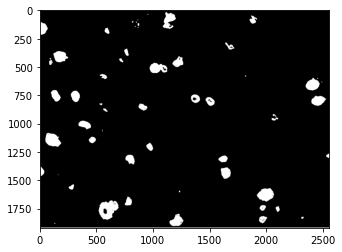

In [797]:
binary=binary-255
plt.imshow(binary,'gray')

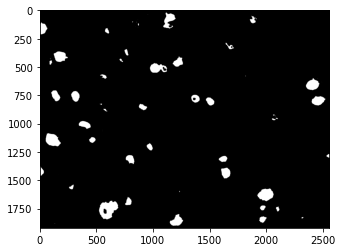

In [504]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=5)
plt.imshow(closed,'gray')

In [507]:
contour2, hierarchy = cv2.findContours(image=closed.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

In [508]:
len(contour2)

65

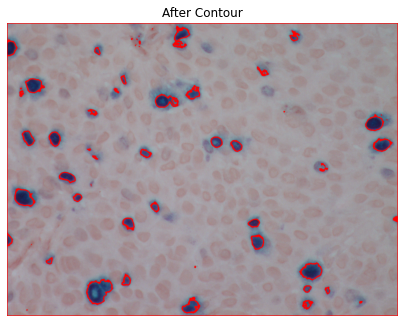

In [509]:
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=img1,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>1):
        cells=cells+1
    
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(img1, cmap="gray"), plt.axis("off");

In [510]:
cells

50

# cell 2

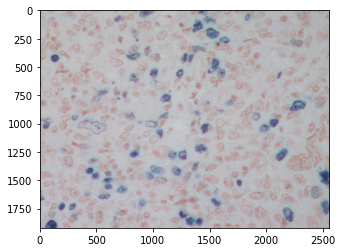

In [547]:
img2=cv2.imread("1714 KI67.jpg")
plt.imshow(img2)

In [548]:
hist_c,bins_c = np.histogram(img2.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c = hist_c.cumsum()
cdf_c_normalized = cdf_c * hist_c.max()/ cdf_c.max()

In [549]:
image_yuv = cv2.cvtColor(img2, cv2.COLOR_BGR2YUV)

# Applying Histogram Equalization on the original imageof the Y channel
image_yuv[:,:,0] = cv2.equalizeHist(image_yuv[:,:,0])

# Convert the YUV image back to RGB format
image_c_equalized = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2BGR)

# Generating the histogram of the equalized image
hist_c_equalized, bins_c_equalized = np.histogram(image_c_equalized.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c_equalized = hist_c_equalized.cumsum()
cdf_c_equalized_normalized = cdf_c_equalized * hist_c_equalized.max()/ cdf_c_equalized.max()

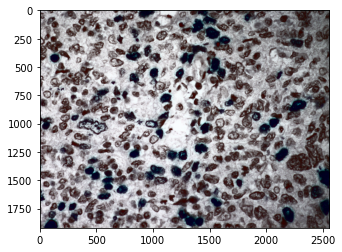

In [550]:
plt.imshow(image_c_equalized)

In [551]:
save_img=cv2.cvtColor(image_c_equalized, cv2.COLOR_BGR2RGB)
cv2.imwrite("1714_contrast.jpg",save_img)

True

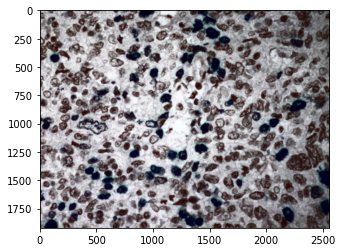

In [552]:
blur = cv2.GaussianBlur(image_c_equalized,(13,13),0)
plt.imshow(blur)

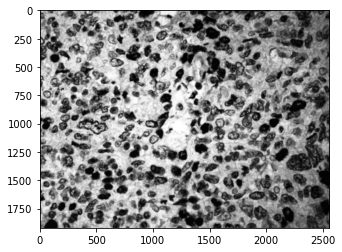

In [553]:
gray1=cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)
plt.imshow(gray1,'gray')

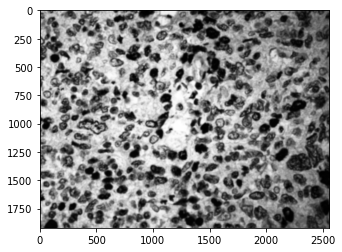

In [554]:
blur = cv2.GaussianBlur(gray1,(21,21),0)
plt.imshow(blur,'gray')

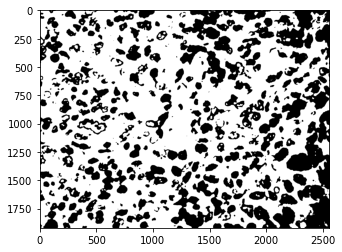

In [555]:
threshold,binary2=cv2.threshold(blur,100,255,cv2.THRESH_BINARY)
plt.imshow(binary2,'gray')

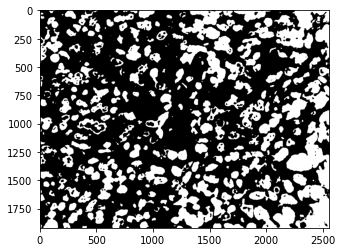

In [556]:
binary=binary2-255
plt.imshow(binary,'gray')

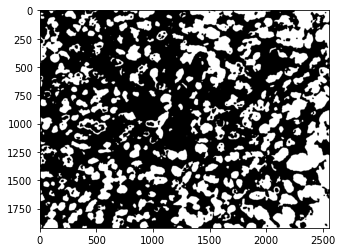

In [557]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=4)
plt.imshow(closed,'gray')

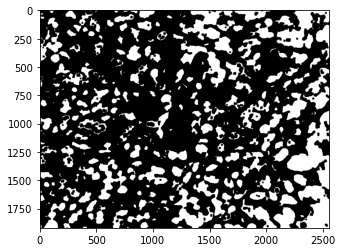

In [558]:
kernel = np.ones((2,2),np.uint8)
erosion = cv2.erode(closed, kernel, iterations=5)
plt.imshow(erosion,'gray')

In [559]:
contour2, hierarchy = cv2.findContours(image=erosion.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

In [560]:
len(contour2)

360

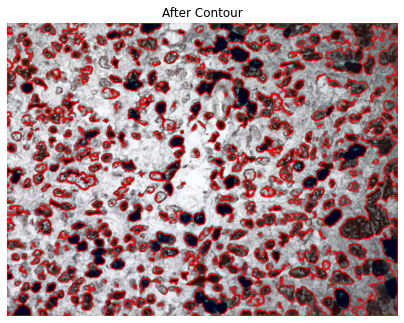

In [561]:
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>0):
        cells=cells+1

plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [562]:
cells

338

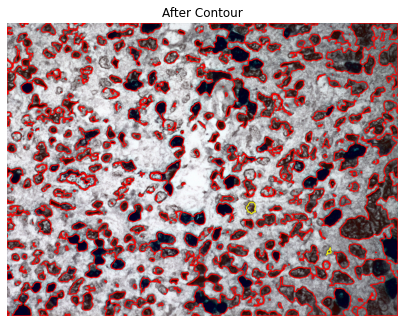

In [563]:
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=129, color=(255,255,0), thickness=5)
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=70, color=(255,255,0), thickness=5)
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [564]:
area=cv2.contourArea(contour2[70])
area

488.0

In [565]:
area=cv2.contourArea(contour2[129])
area

3091.0

In [566]:
cells=0
for i in range(len(contour2)):
    area=cv2.contourArea(contour2[i])
    if(area>300):
        if(area>3500):
            cells=cells+(area//3500)
        else:
            cells=cells+1 

In [567]:
cells

427.0

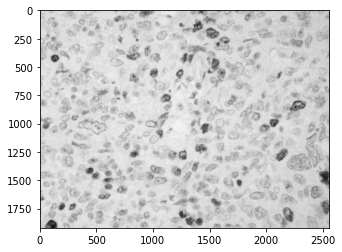

In [568]:
gray_org=cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_org,'gray')

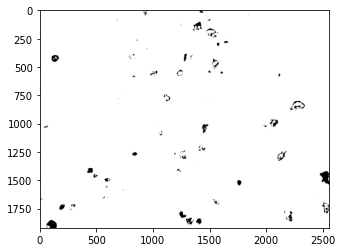

In [570]:
thresh, binary = cv2.threshold(gray_org, thresh=110, maxval=255, type=cv2.THRESH_BINARY)
plt.imshow(binary,'gray')

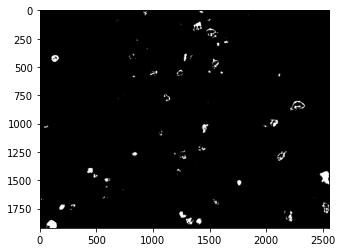

In [571]:
binary=binary-255
plt.imshow(binary,'gray')

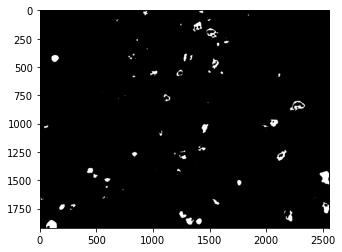

In [582]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=5)
plt.imshow(closed,'gray')

In [583]:
contour2, hierarchy = cv2.findContours(image=closed.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

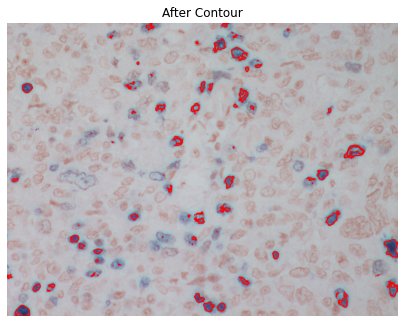

In [584]:
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=img2,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>1):
        cells=cells+1
    
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(img2, cmap="gray"), plt.axis("off");

In [585]:
cells

74

# cell 3

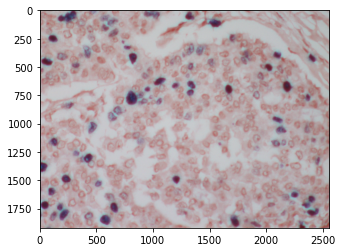

In [650]:
img3=cv2.imread("1718 KI67.jpg")
plt.imshow(img3)

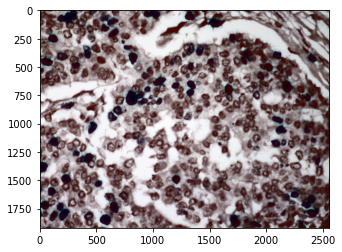

In [632]:
hist_c,bins_c = np.histogram(img3.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c = hist_c.cumsum()
cdf_c_normalized = cdf_c * hist_c.max()/ cdf_c.max()
image_yuv = cv2.cvtColor(img3, cv2.COLOR_BGR2YUV)

# Applying Histogram Equalization on the original imageof the Y channel
image_yuv[:,:,0] = cv2.equalizeHist(image_yuv[:,:,0])

# Convert the YUV image back to RGB format
image_c_equalized = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2BGR)

# Generating the histogram of the equalized image
hist_c_equalized, bins_c_equalized = np.histogram(image_c_equalized.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c_equalized = hist_c_equalized.cumsum()
cdf_c_equalized_normalized = cdf_c_equalized * hist_c_equalized.max()/ cdf_c_equalized.max()
plt.imshow(image_c_equalized)

In [633]:
save_img=cv2.cvtColor(image_c_equalized, cv2.COLOR_BGR2RGB)
cv2.imwrite("1718_contrast.jpg",save_img)

True

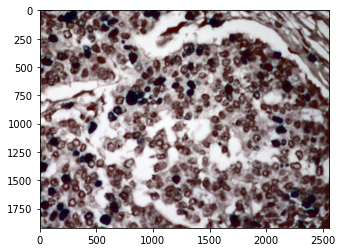

In [589]:
blur = cv2.GaussianBlur(image_c_equalized,(13,13),0)
plt.imshow(blur)

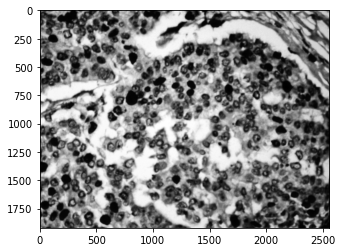

In [590]:
gray1=cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)
plt.imshow(gray1,'gray')

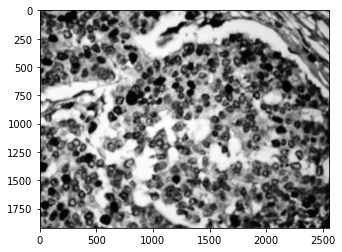

In [591]:
blur = cv2.GaussianBlur(gray1,(21,21),0)
plt.imshow(blur,'gray')

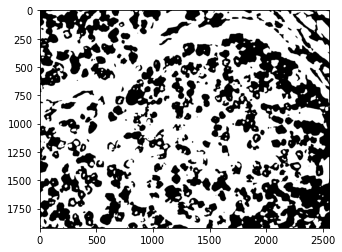

In [592]:
threshold,binary2=cv2.threshold(blur,100,255,cv2.THRESH_BINARY)
plt.imshow(binary2,'gray')

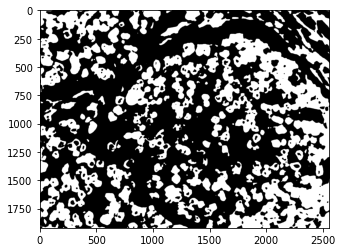

In [593]:
binary=binary2-255
plt.imshow(binary,'gray')

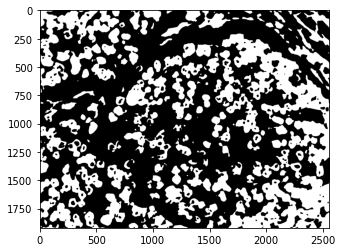

In [594]:
kernel = np.ones((2,2),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=4)
plt.imshow(closed,'gray')

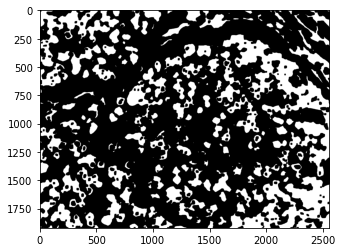

In [595]:
kernel = np.ones((2,2),np.uint8)
erosion = cv2.erode(closed, kernel, iterations=7)
plt.imshow(erosion,'gray')

In [596]:
contour2, hierarchy = cv2.findContours(image=erosion.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

In [597]:
len(contour2)

250

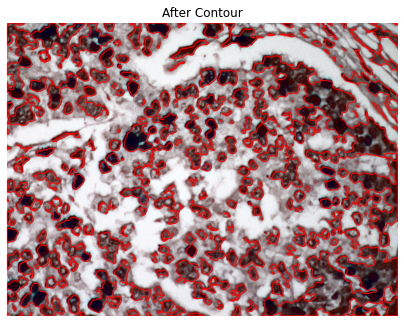

In [598]:
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>0):
        cells=cells+1

plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [599]:
cells

236

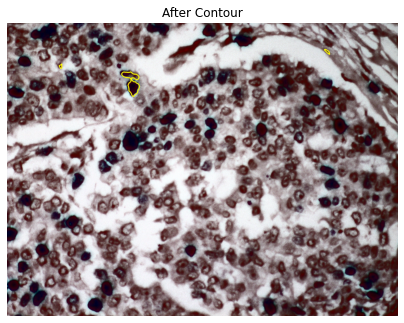

In [635]:
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=217, color=(255,255,0), thickness=5)
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=201, color=(255,255,0), thickness=5)
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [629]:
area=cv2.contourArea(contour2[217])
area

423.0

In [437]:
area=cv2.contourArea(contour2[201])/2
area

4231.5

In [438]:
cells=0
for i in range(len(contour2)):
    area=cv2.contourArea(contour2[i])
    if(area>500):
        if(area>4300):
            cells=cells+(area//4300)
        else:
            cells=cells+1 

In [439]:
cells

350.0

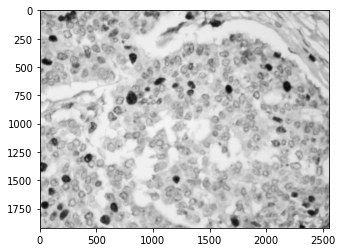

In [636]:
gray=cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
plt.imshow(gray,'gray')

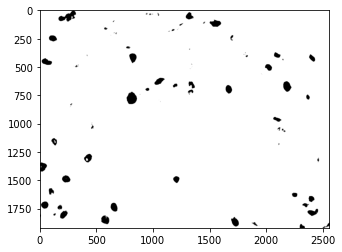

In [660]:
thresh, binary = cv2.threshold(gray, thresh=90, maxval=255, type=cv2.THRESH_BINARY)
plt.imshow(binary,'gray')

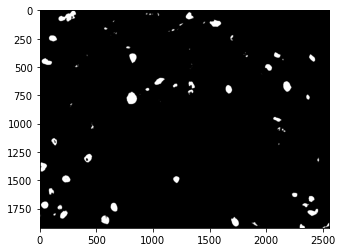

In [661]:
binary=binary-255
plt.imshow(binary,'gray')

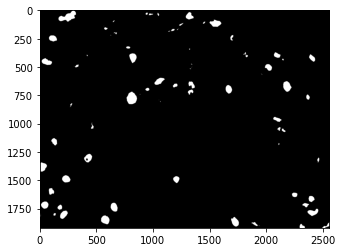

In [662]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=5)
plt.imshow(closed,'gray')

In [666]:
contour2, hierarchy = cv2.findContours(image=closed.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

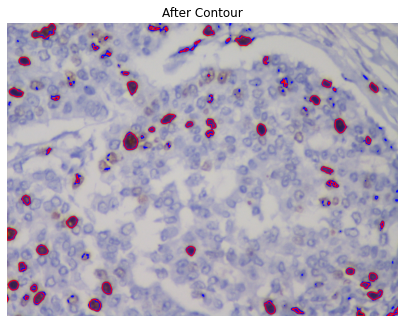

In [668]:
image=cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=image,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>1):
        cells=cells+1
    
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image, cmap="gray"), plt.axis("off");

In [669]:
cells

72

# cells4

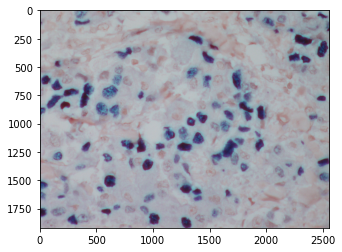

In [775]:
img4=cv2.imread("2141 KI67.jpg")
plt.imshow(img4)

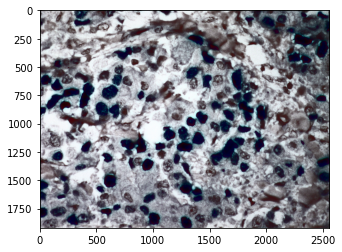

In [776]:
hist_c,bins_c = np.histogram(img4.flatten(),256,[0,256])
# Generating the cumulative distribution function of the original image
cdf_c = hist_c.cumsum()
cdf_c_normalized = cdf_c * hist_c.max()/ cdf_c.max()
image_yuv = cv2.cvtColor(img4, cv2.COLOR_BGR2YUV)

# Applying Histogram Equalization on the original imageof the Y channel
image_yuv[:,:,0] = cv2.equalizeHist(image_yuv[:,:,0])

# Convert the YUV image back to RGB format
image_c_equalized = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2BGR)

# Generating the histogram of the equalized image
hist_c_equalized, bins_c_equalized = np.histogram(image_c_equalized.flatten(),256,[0,256])

# Generating the cumulative distribution function of the original image
cdf_c_equalized = hist_c_equalized.cumsum()
cdf_c_equalized_normalized = cdf_c_equalized * hist_c_equalized.max()/ cdf_c_equalized.max()
plt.imshow(image_c_equalized)

In [777]:
save_img=cv2.cvtColor(image_c_equalized, cv2.COLOR_BGR2RGB)
cv2.imwrite("2141_contrast.jpg",save_img)

True

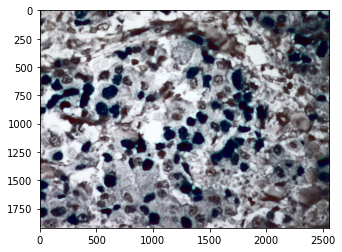

In [727]:
blur = cv2.GaussianBlur(image_c_equalized,(13,13),0)
plt.imshow(blur)

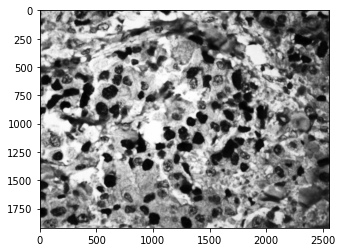

In [728]:
gray1=cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)
plt.imshow(gray1,'gray')

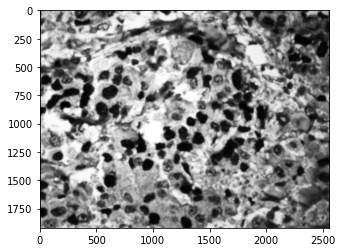

In [729]:
blur = cv2.GaussianBlur(gray1,(21,21),0)
plt.imshow(blur,'gray')

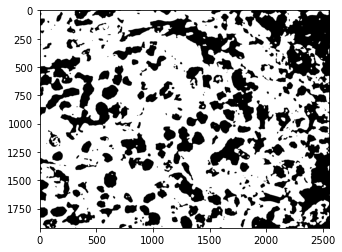

In [730]:
threshold,binary2=cv2.threshold(blur,100,255,cv2.THRESH_BINARY)
plt.imshow(binary2,'gray')

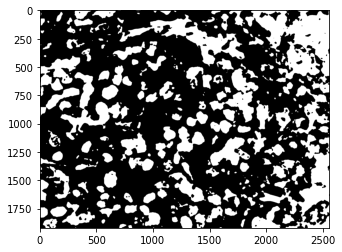

In [731]:
binary=binary2-255
plt.imshow(binary,'gray')

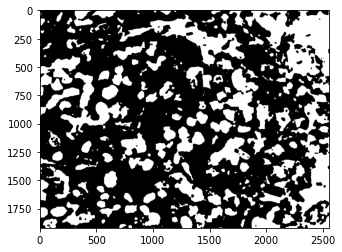

In [732]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=4)
plt.imshow(closed,'gray')

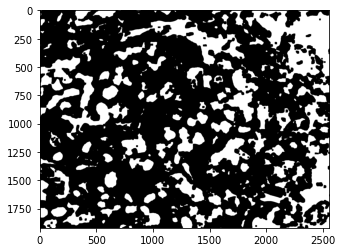

In [733]:
kernel = np.ones((2,2),np.uint8)
erosion = cv2.erode(closed, kernel, iterations=5)
plt.imshow(erosion,'gray')

In [734]:
contour2, hierarchy = cv2.findContours(image=erosion.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

In [735]:
len(contour2)

285

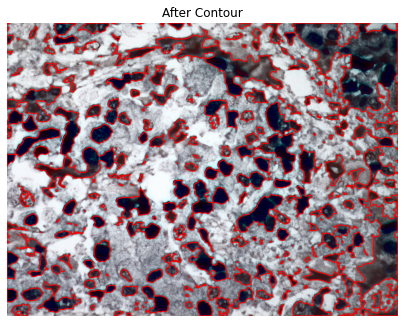

In [736]:
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>0):
        cells=cells+1

plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [737]:
cells

267

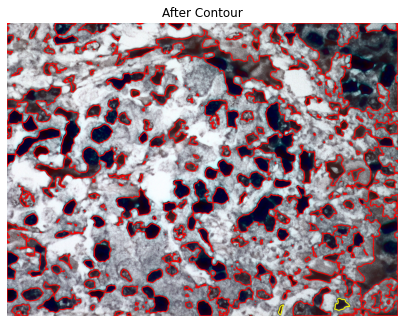

In [738]:
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=15, color=(255,255,0), thickness=5)
cv2.drawContours(image=image_c_equalized,contours=contour2,contourIdx=6, color=(255,255,0), thickness=5)
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image_c_equalized, cmap="gray"), plt.axis("off");

In [739]:
area=cv2.contourArea(contour2[15])
area

4494.5

In [740]:
area=cv2.contourArea(contour2[6])
area

945.5

In [741]:
cells=0
for i in range(len(contour2)):
    area=cv2.contourArea(contour2[i])
    if(area>700):
        if(area>4500):
            cells=cells+(area//4500)
        else:
            cells=cells+1 

In [742]:
cells

320.0

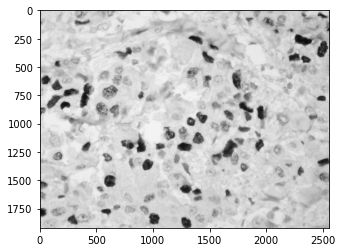

In [743]:
gray=cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY)
plt.imshow(gray,'gray')

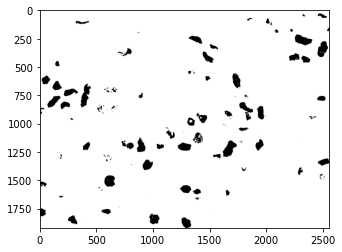

In [768]:
thresh, binary = cv2.threshold(gray, thresh=90, maxval=255, type=cv2.THRESH_BINARY)
plt.imshow(binary,'gray')

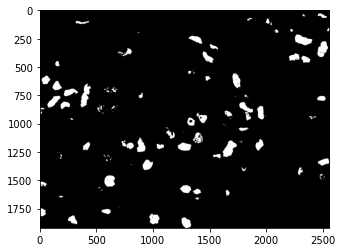

In [769]:
binary=binary-255
plt.imshow(binary,'gray')

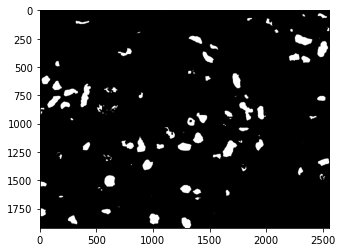

In [770]:
kernel = np.ones((3,3),np.uint8)
closed = cv2.morphologyEx(binary,cv2.MORPH_CLOSE, kernel=kernel, iterations=5)
plt.imshow(closed,'gray')

In [771]:
contour2, hierarchy = cv2.findContours(image=closed.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

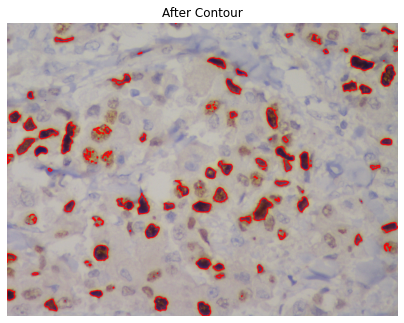

In [772]:
image=cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
cells=0
for i in range(len(contour2)):
    cv2.drawContours(image=image,contours=contour2,contourIdx=i, color=(255,0,0), thickness=5)
    area=cv2.contourArea(contour2[i])
    if(area>1):
        cells=cells+1
    
plt.figure(figsize=(7,7)), plt.title("After Contour"), plt.imshow(image, cmap="gray"), plt.axis("off");

In [773]:
cells

111

In [ ]:
Accuracy = 100% - Error Rate 
Error Rate  = |Observed Value - Actual Value|/Actual Value × 100 

In [793]:
(34.68-54.87)/54.87

-0.36796063422635317

In [794]:
100-36.796063422

63.203936578